<a href="https://colab.research.google.com/github/OmriGruman/object-detection/blob/master/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Object Detection using YOLOv3 architecture

In [ ]:
!git clone https://github.com/ultralytics/yolov3  # clone
%cd yolov3
%pip install -qr requirements.txt  # install

import torch
from yolov3 import utils
display = utils.notebook_init()  # checks

Setup complete ✅


detect: weights=['yolov3.pt'], source=data/images, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv3 🚀 v9.6.0-32-gae460cf torch 1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

100% 119M/119M [00:01<00:00, 64.4MB/s]

Fusing layers... 
Model Summary: 261 layers, 61922845 parameters, 0 gradients
image 1/2 /content/yolov3/data/images/bus.jpg: 640x480 4 persons, 1 bicycle, 1 bus, Done. (0.020s)
image 2/2 /content/yolov3/data/images/zidane.jpg: 384x640 2 persons, 2 ties, Done. (0.020s)
Speed: 0.7ms pre-process, 20.2ms inference, 18.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


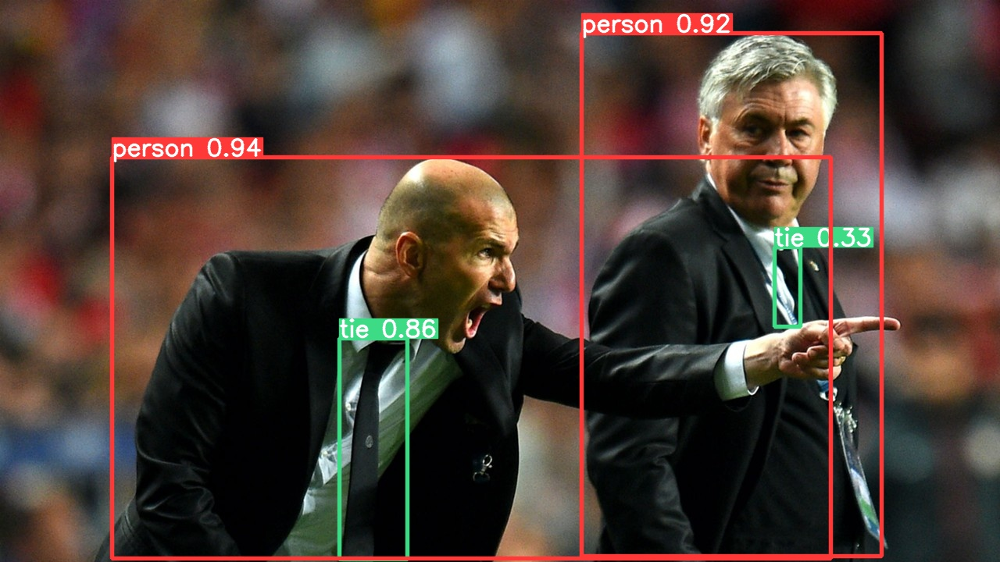

In [ ]:
!python detect.py --weights yolov3.pt --img 640 --conf 0.25 --source data/images
display.Image(filename='runs/detect/exp/zidane.jpg', width=600)

In [ ]:
# Download COCO val
torch.hub.download_url_to_file('https://ultralytics.com/assets/coco2017val.zip', 'tmp.zip')
!unzip -q tmp.zip -d ../datasets && rm tmp.zip

  0%|          | 0.00/780M [00:00<?, ?B/s]

In [ ]:
# Run YOLOv3 on COCO val
!python val.py --weights yolov3.pt --data coco.yaml --img 640 --iou 0.65 --half

val: data=/content/yolov3/data/coco.yaml, weights=['yolov3.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, task=val, device=, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=True, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv3 🚀 v9.6.0-32-gae460cf torch 1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
Model Summary: 261 layers, 61922845 parameters, 0 gradients
val: Scanning '../datasets/coco/val2017' images and labels...4952 found, 48 missing, 0 empty, 0 corrupted: 100% 5000/5000 [00:00<00:00, 9131.21it/s]
val: New cache created: ../datasets/coco/val2017.cache
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 157/157 [00:45<00:00,  3.45it/s]
                 all       5000      36335      0.722      0.598      0.652      0.456
Speed: 0.1ms pre-process, 2.0ms inference, 1.3ms NMS per image at shape (32, 3, 640, 640)



In [ ]:
# Download COCO test-dev2017
torch.hub.download_url_to_file('https://ultralytics.com/assets/coco2017labels.zip', 'tmp.zip')
!unzip -q tmp.zip -d ../datasets && rm tmp.zip
!f="test2017.zip" && curl http://images.cocodataset.org/zips/$f -o $f && unzip -q $f -d ../datasets/coco/images

  0%|          | 0.00/46.4M [00:00<?, ?B/s]

replace ../datasets/coco/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename:   % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 6339M  100 6339M    0     0  56.7M      0  0:01:51  0:01:51 --:--:-- 65.6M


In [ ]:
# Run YOLOv3 on COCO test
!python val.py --weights yolov3.pt --data coco.yaml --img 640 --iou 0.65 --half --task test

val: data=/content/yolov3/data/coco.yaml, weights=['yolov3.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, task=test, device=, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=True, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv3 🚀 v9.6.0-32-gae460cf torch 1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
Model Summary: 261 layers, 61922845 parameters, 0 gradients
Traceback (most recent call last):
  File "/content/yolov3/utils/datasets.py", line 408, in __init__
    raise Exception(f'{prefix}{p} does not exist')
Exception: test: ../datasets/coco/test-dev2017.txt does not exist

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "val.py", line 367, in <module>
    main(opt)
  File "val.py", line 340, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.8/dist-packages/torch/autograd/grad_mode.py"

In [ ]:
# Tensorboard  (optional)
%load_ext tensorboard
%tensorboard --logdir runs/train

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 5011), started 0:00:55 ago. (Use '!kill 5011' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# Train YOLOv3 on COCO128 for 3 epochs
!python train.py --img 640 --batch 16 --epochs 3 --data coco128.yaml --weights yolov3.pt --cache

train: weights=yolov3.pt, cfg=, data=coco128.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=3, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov3 ✅
YOLOv3 🚀 v9.6.0-32-gae460cf torch 1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scal

In [ ]:
# import torchvision
# import torch.nn as nn
# import torch.optim as optim
# from torch.utils.data import DataLoader
# import albumentations as A
# import matplotlib.pyplot as plt
# from tqdm import tqdm
# from torchvision.transforms import ToTensor
# import sys
# sys.path.append('path/to/ultralytics/yolov3')
# from models import *


# # Load the dataset
# dataset = torchvision.datasets.CocoDetection(root='/content/train2017',
#                                               annFile='/content/annotations/captions_train2017.json',
#                                               transform=A.Compose([
#                                                   A.Resize(512, 512),
#                                                   A.Normalize(),
#                                                   ToTensor()
#                                               ]))

# # Split the dataset into train and test sets
# train_set, test_set = torch.utils.data.random_split(dataset, [len(dataset) - len(dataset) // 5, len(dataset) // 5])

# # Create data loaders for train and test sets
# train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
# test_loader = DataLoader(test_set, batch_size=32, shuffle=False)

# # Load the pre-trained YOLOv3 model
# model = Darknet("config/yolov3.cfg", img_size=512)
# model.load_weights("weights/yolov3.weights")

# # Freeze some of the layers
# for param in model.parameters():
#     param.requires_grad = False

# # Replace the final layer with a new one for our specific task
# model.classifier[-1] = nn.Linear(model.classifier[-1].in_features, len(dataset.classes))

# # Use Cross Entropy Loss and Adam optimizer
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.parameters())

# # Train the model
# def train(model, criterion, optimizer, train_loader, test_loader, num_epochs=20):
#     model.train()
#     train_loss = []
#     test_loss = []
#     for epoch in range(num_epochs):
#         print('Epoch {}/{}'.format(epoch + 1, num_epochs))
#         running_loss = 0.0
#         for data, target in tqdm(train_loader):
#             optimizer.zero_grad()
#             output = model(data)
#             loss = criterion(output, target)
#             loss.backward()
#             optimizer.step()
#             running_loss += loss.item()
#         train_loss.append(running_loss / len(train_loader))

#     # Evaluate the model on the test set
#         with torch.no_grad():
#             model.eval()
#             running_loss = 0.0
#             for data, target in test_loader:
#                 output = model(data)
#                 loss = criterion(output, target)
#                 running_loss += loss.item()
#             test_loss.append(running_loss / len(test_loader))
        
#         print('Train Loss: {:.4f} | Test Loss: {:.4f}'.format(train_loss[-1], test_loss[-1]))
        
#     # Plot the training and validation loss
#     plt.plot(train_loss, label='Train Loss')
#     plt.plot(test_loss, label='Test Loss')
#     plt.legend()
#     plt.show()

# # Train the model
# train(model, criterion, optimizer, train_loader, test_loader, num_epochs=20)

Checking setup...


ModuleNotFoundError: ignored

In [ ]:
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip

--2023-02-07 22:27:59--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.197.249, 52.217.65.116, 52.217.198.113, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.197.249|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  88.8MB/s    in 2.7s    

2023-02-07 22:28:01 (88.8 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]



In [ ]:
!python detect.py --weights yolov3.pt --img 640 --conf 0.25 --source data/images

detect: weights=['yolov3.pt'], source=data/images, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv3 🚀 v9.6.0-32-gae460cf torch 1.13.1+cu116 CPU

100% 119M/119M [00:01<00:00, 93.7MB/s]

Fusing layers... 
Model Summary: 261 layers, 61922845 parameters, 0 gradients
image 1/2 /content/yolov3/data/images/bus.jpg: 640x480 4 persons, 1 bicycle, 1 bus, Done. (1.206s)
image 2/2 /content/yolov3/data/images/zidane.jpg: 384x640 2 persons, 2 ties, Done. (0.896s)
Speed: 1.6ms pre-process, 1051.1ms inference, 14.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


In [ ]:
torch.hub.download_url_to_file('https://ultralytics.com/assets/coco2017val.zip', 'tmp.zip')
!unzip -q tmp.zip -d ../datasets && rm tmp.zip

NameError: ignored